#Objective: Classifify image Categories

### Step 1: Importing all the packages

In [ ]:
# import the necessary packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import random
import cv2
import os

import warnings
from tqdm import tqdm_notebook as tqdm
import itertools

import tensorflow as tf
print(tf.__version__)
warnings.filterwarnings("ignore")
SEED = 42   # set random seed

2.14.0


### Step 2: Loading your data from disk for training

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# change working DIR
import os
os.chdir("/content/drive/MyDrive/Deep Learning/CNN")

In [ ]:
!dir

CNN.ipynb  dataset  dataset.rar  model_CNN.h5  test_examples  test_examples.rar


In [ ]:
# # Extract dataset.rar file
# !pip install patool
# import patoolib
# patoolib.extract_archive("dataset.rar")
# patoolib.extract_archive("test_examples.rar")

In [ ]:
!dir

CNN.ipynb  dataset  dataset.rar  model_CNN.h5  test_examples  test_examples.rar


#Step 3:Built CNN Model

In [ ]:
# create CNN model
class LeNet:
    @staticmethod
    def build(width, height, depth, classes):

        # initialize the model
        model = Sequential()
        inputShape = (height, width, depth) # (h, h, chanel)

        # if we are using "channels first", update the input shape
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(100, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))

        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model



In [ ]:
DATASET = "dataset"  #this folder must contain three subfolder with images
MODEL = "Scene.model" #name to store the model on disk
PLOT = "plot.png" #plot name

In [ ]:
#initialize the data and labels
print("[INFO] loadings images...")
data = []
labels = []

#grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(DATASET)))
random.seed(42)
random.shuffle(imagePaths)
#progress bar
with tqdm(total=len(imagePaths)) as pbar:

    #loop over theinput images
    for idx, imagePath in enumerate(imagePaths):
        #load the image ,pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        data.append(image)

        #extract the class label from the image path and update the
        #label list
        label = imagePath.split(os.path.sep)[-2]

        if label == "Buildings":
            label = 0
        elif label == "Forest":
            label = 1
        elif label == "Sea":
            label = 2


        labels.append(label)

        #update the progressbar
        pbar.update(1)


[INFO] loadings images...


  0%|          | 0/1326 [00:00<?, ?it/s]

In [ ]:
data[0].shape

(28, 28, 3)

In [ ]:
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)


In [ ]:
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size = 0.25, random_state=42)

In [ ]:
trainX.shape

(994, 28, 28, 3)

In [ ]:
trainY.shape

(994,)

#Label Encoder

One hot encoder

In [ ]:
trainY = to_categorical(trainY, num_classes=3) #converting
testY = to_categorical(testY, num_classes=3)

In [ ]:
trainY[0]

array([1., 0., 0.], dtype=float32)

In [ ]:
# construct the image generator for data augmentation
aug = ImageDataGenerator(rotation_range=30,
                         width_shift_range=0.1,
                         height_shift_range=0.1,
                         shear_range=0.2,
                         zoom_range=0.2,
                         horizontal_flip=True,
                         fill_mode="nearest")

In [ ]:
EPOCHS=50
INIT_LR = 1e-3
BS = 32
#initialize the model
print("[INFO] compliling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=3)
opt = Adam(lr=INIT_LR) #using Adam optimizer

model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

print("[INFO] model complied...")


[INFO] compliling model...


[INFO] model complied...


In [ ]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 20)        1520      
                                                                 
 activation (Activation)     (None, 28, 28, 20)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 20)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 50)        25050     
                                                                 
 activation_1 (Activation)   (None, 14, 14, 50)        0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 50)          0         
 g2D)                                                   

In [ ]:
# train the network
print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(testX, testY),
              steps_per_epoch=len(trainX)//BS,
              epochs=50,
              verbose=1)

[INFO] training network...
Epoch 1/50
31/31 [==============================] - 12s 122ms/step - loss: 0.8887 - accuracy: 0.5416 - val_loss: 0.9579 - val_accuracy: 0.4819
Epoch 2/50
31/31 [==============================] - 1s 42ms/step - loss: 0.8223 - accuracy: 0.5977 - val_loss: 0.6479 - val_accuracy: 0.7380
Epoch 3/50
31/31 [==============================] - 1s 20ms/step - loss: 0.7321 - accuracy: 0.6840 - val_loss: 0.6198 - val_accuracy: 0.7380
Epoch 4/50
31/31 [==============================] - 1s 20ms/step - loss: 0.6402 - accuracy: 0.7328 - val_loss: 0.5436 - val_accuracy: 0.7741
Epoch 5/50
31/31 [==============================] - 1s 20ms/step - loss: 0.6331 - accuracy: 0.7505 - val_loss: 0.4980 - val_accuracy: 0.7892
Epoch 6/50
31/31 [==============================] - 1s 21ms/step - loss: 0.6313 - accuracy: 0.7297 - val_loss: 0.4620 - val_accuracy: 0.7982
Epoch 7/50
31/31 [==============================] - 1s 21ms/step - loss: 0.5718 - accuracy: 0.7661 - val_loss: 0.5713 - val_a

# Generate Plots for acc and val

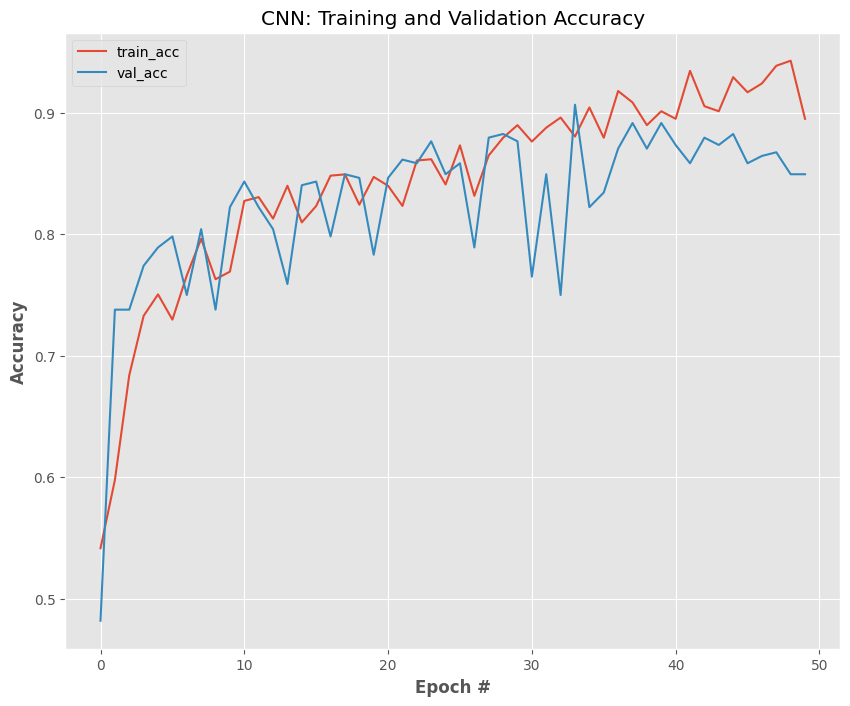

In [ ]:
# plot the training and validation accuracy
N = np.arange(0, 50)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

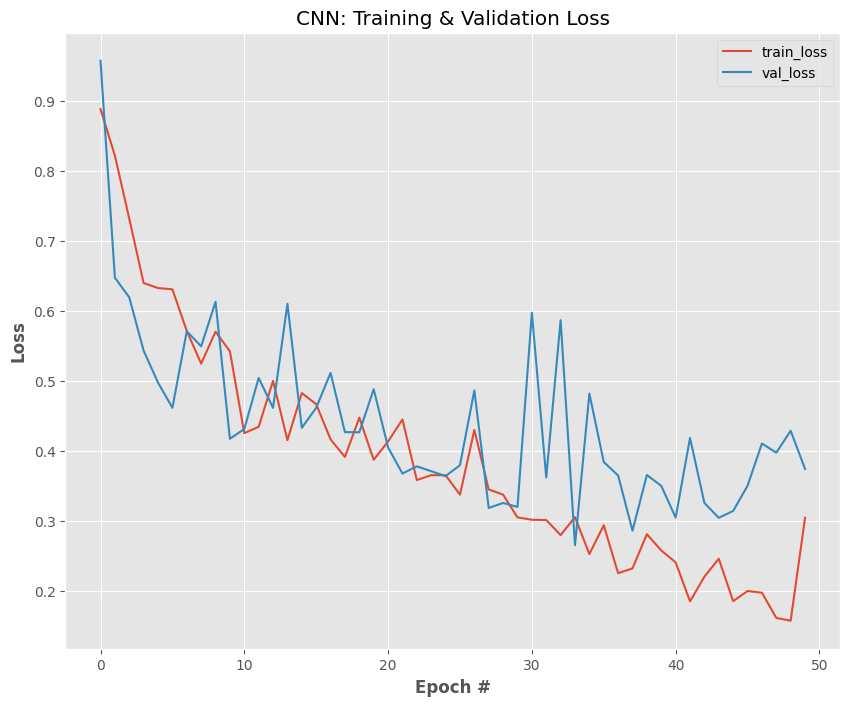

In [ ]:
# plot the training and validation loss
N = np.arange(0, 50)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("CNN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

In [ ]:
# save the model and label binarizer to disk
print("[INFO] serializing network and label binarizer...")
model.save('model_CNN.h5')


[INFO] serializing network and label binarizer...


In [ ]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
from imutils import paths
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    #plt.grid(b=None)
    ax = fig.add_subplot(111)

    ax.imshow(img)

In [ ]:
from tqdm import tqdm

[INFO] loading network and...


  0%|          | 0/28 [00:00<?, ?it/s]

1/1 [==============================] - 0s 183ms/step


  4%|▎         | 1/28 [00:00<00:06,  3.95it/s]

[0.09352791 0.06060547 0.8458666 ]
1/1 [==============================] - 0s 17ms/step
[0.08469982 0.912299   0.00300119]
1/1 [==============================] - 0s 16ms/step
[0.05653966 0.01260334 0.930857  ]


 11%|█         | 3/28 [00:00<00:04,  5.13it/s]

1/1 [==============================] - 0s 20ms/step
[0.01024988 0.01671081 0.9730393 ]
1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 5/28 [00:00<00:03,  7.59it/s]

[0.14513902 0.00364247 0.8512185 ]
1/1 [==============================] - 0s 18ms/step
[0.68510437 0.00509935 0.30979624]
1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 7/28 [00:00<00:02,  9.32it/s]

[0.08413299 0.01871814 0.89714885]
1/1 [==============================] - 0s 18ms/step
[0.00612943 0.04234957 0.951521  ]
1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 9/28 [00:01<00:01, 10.23it/s]

[0.01361618 0.00772537 0.97865844]
1/1 [==============================] - 0s 20ms/step
[0.00860672 0.01004855 0.9813447 ]
1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 11/28 [00:01<00:01, 10.94it/s]

[9.9422520e-01 1.2947715e-04 5.6453599e-03]
1/1 [==============================] - 0s 19ms/step
[0.9694791  0.01137771 0.01914315]
1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 13/28 [00:01<00:01, 11.70it/s]

[0.36652446 0.56627566 0.06719994]
1/1 [==============================] - 0s 18ms/step
[0.94059426 0.0316014  0.02780439]
1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 15/28 [00:01<00:01, 12.24it/s]

[2.0774053e-01 7.9223222e-01 2.7220129e-05]
1/1 [==============================] - 0s 19ms/step
[0.9796734  0.00292398 0.01740262]
1/1 [==============================] - 0s 16ms/step


 61%|██████    | 17/28 [00:01<00:00, 12.32it/s]

[0.9671569  0.00946181 0.02338132]
1/1 [==============================] - 0s 18ms/step
[0.92195374 0.00202232 0.07602393]
1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 19/28 [00:01<00:00, 12.62it/s]

[7.9467278e-03 9.9201715e-01 3.6190107e-05]
1/1 [==============================] - 0s 20ms/step
[7.9936709e-04 9.9918991e-01 1.0696882e-05]
1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 21/28 [00:01<00:00, 12.51it/s]

[3.3482131e-06 9.9999666e-01 2.2849971e-08]
1/1 [==============================] - 0s 20ms/step
[0.38783693 0.58654517 0.02561788]
1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 23/28 [00:02<00:00, 12.64it/s]

[1.9701004e-07 9.9999976e-01 2.2757343e-09]
1/1 [==============================] - 0s 18ms/step
[1.1447756e-02 9.8797417e-01 5.7802087e-04]
1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 25/28 [00:02<00:00, 12.90it/s]

[8.2513792e-03 9.9133003e-01 4.1858605e-04]
1/1 [==============================] - 0s 18ms/step
[2.2688739e-04 9.9942821e-01 3.4491732e-04]
1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 27/28 [00:02<00:00, 12.75it/s]

[5.5963959e-05 9.9994409e-01 4.3010026e-08]
1/1 [==============================] - 0s 18ms/step


100%|██████████| 28/28 [00:02<00:00, 11.09it/s]

[2.4146959e-02 9.7578818e-01 6.4963766e-05]


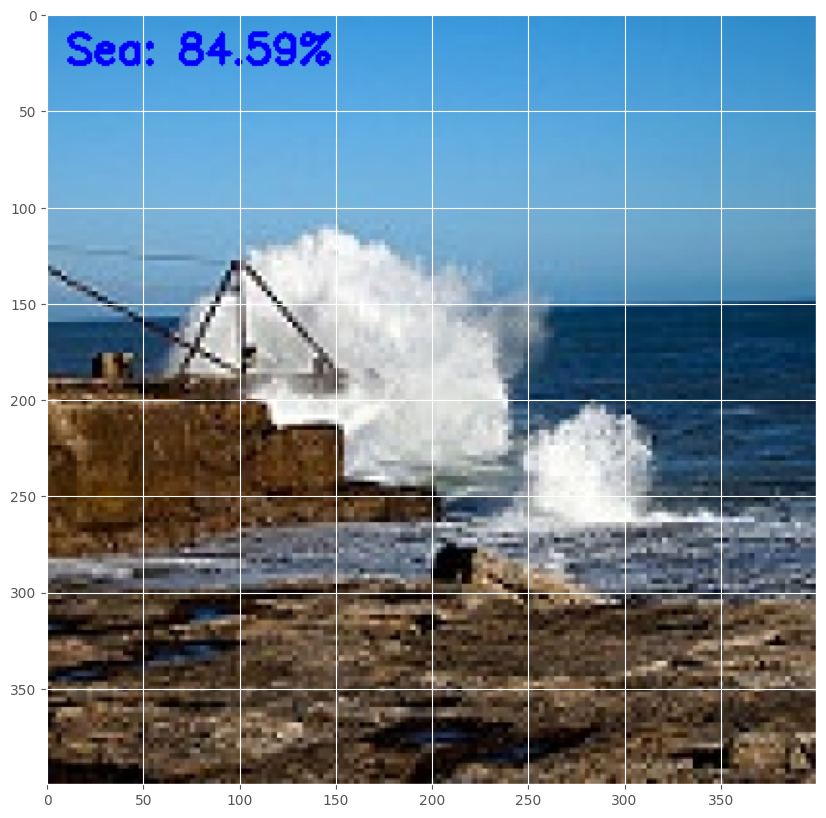

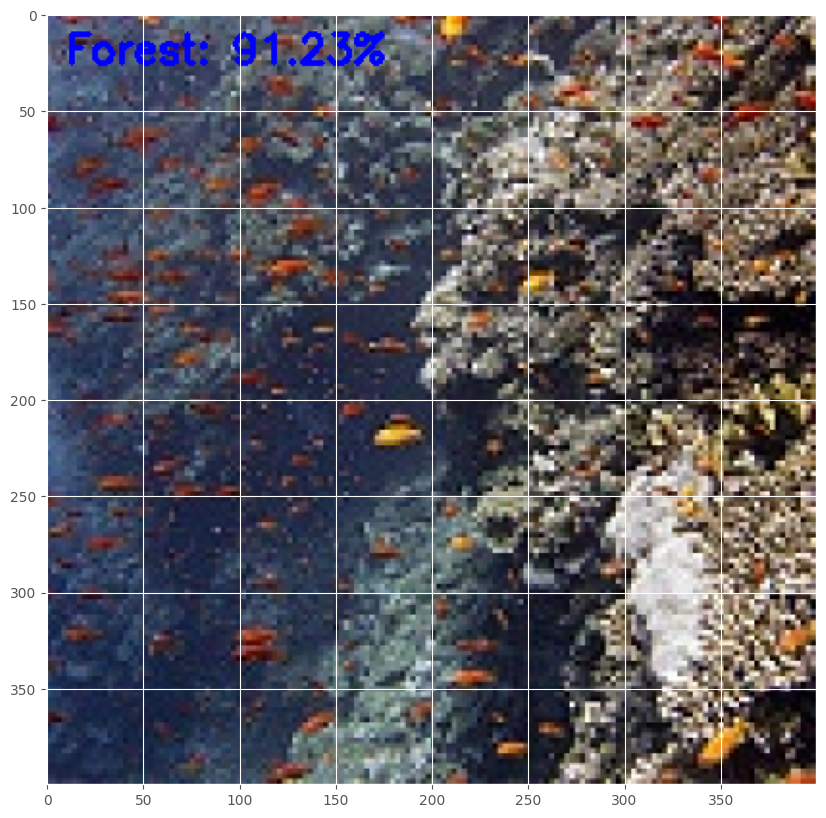

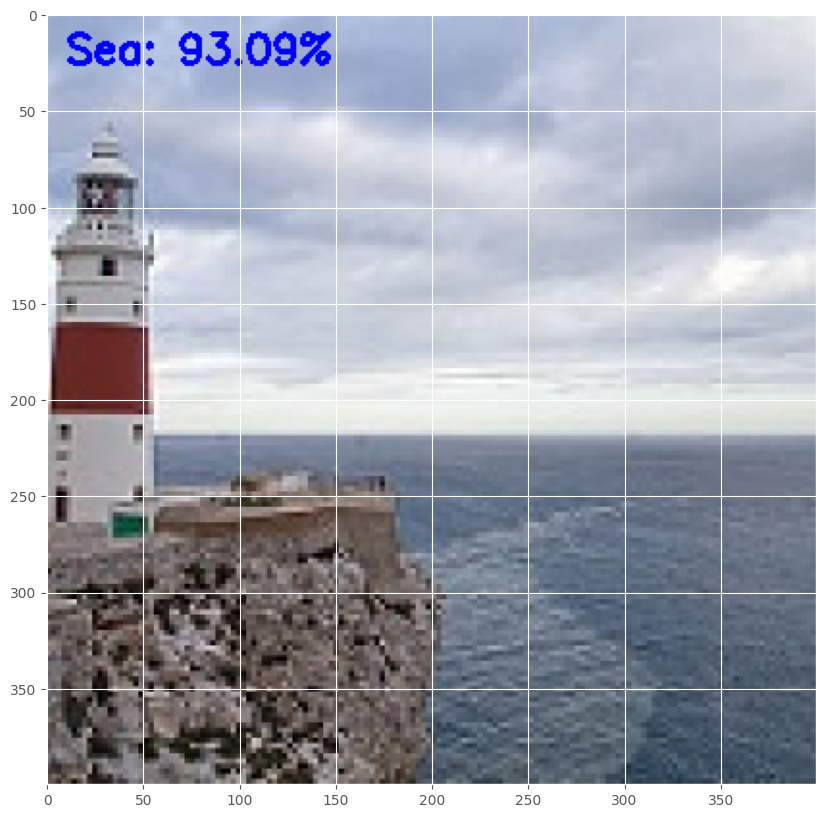

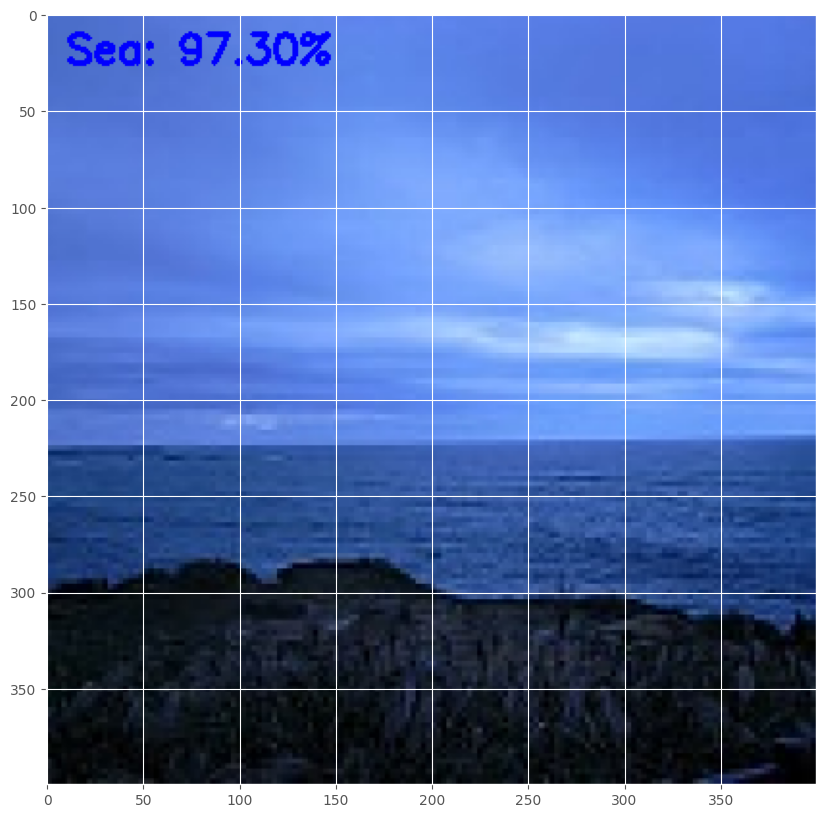

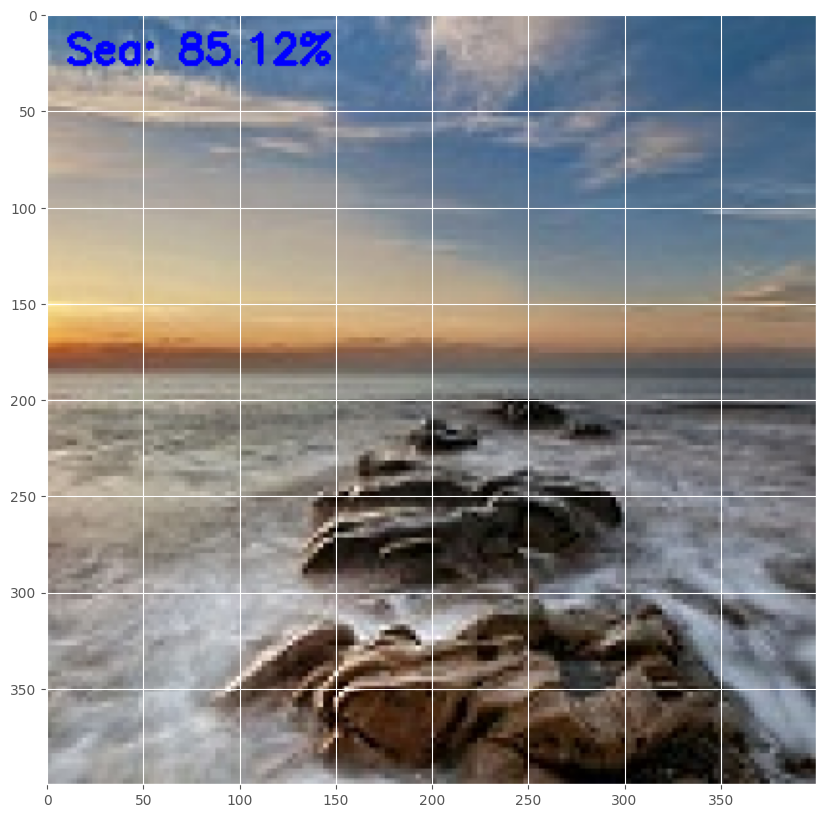

...

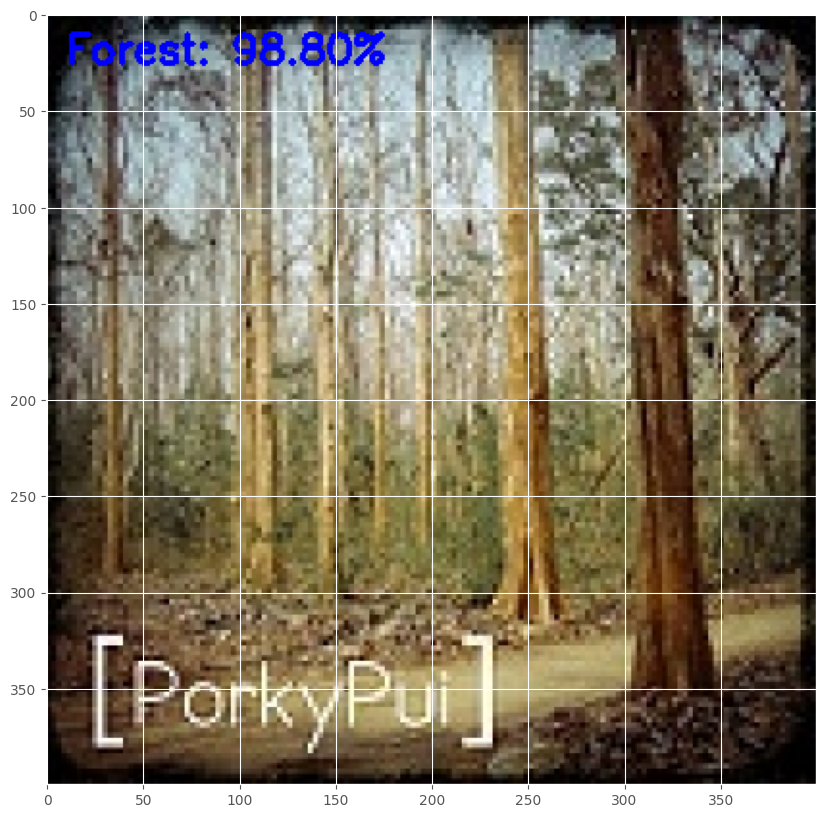

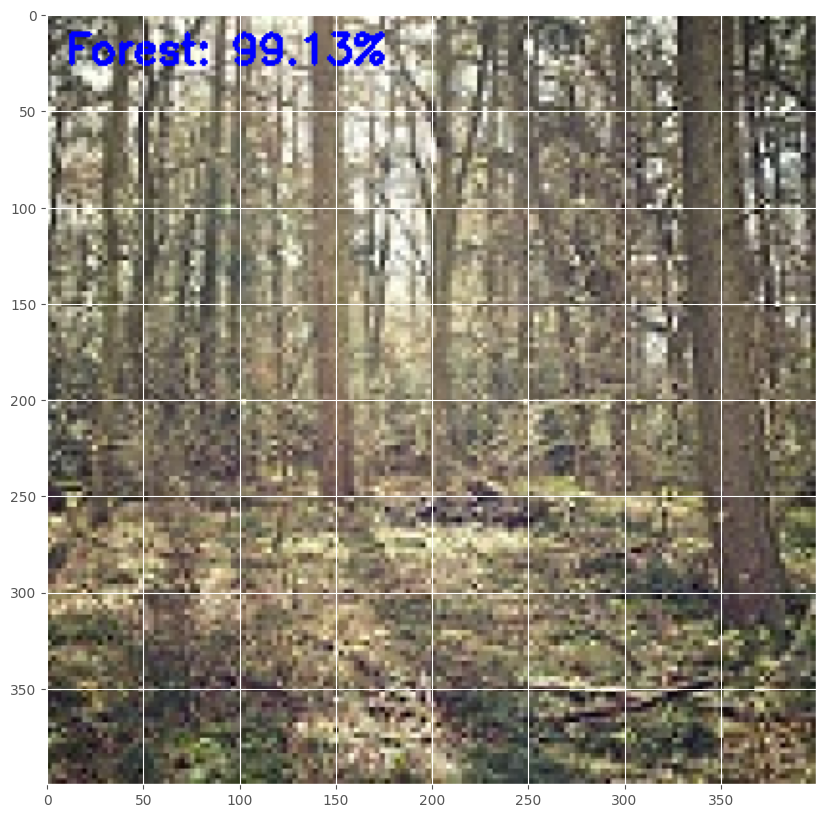

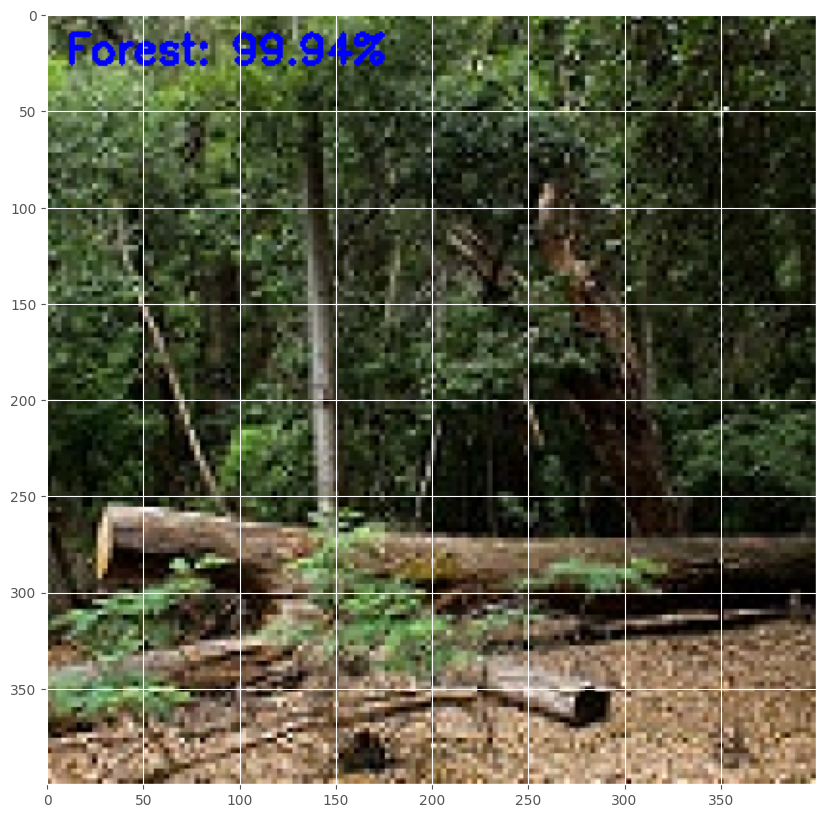

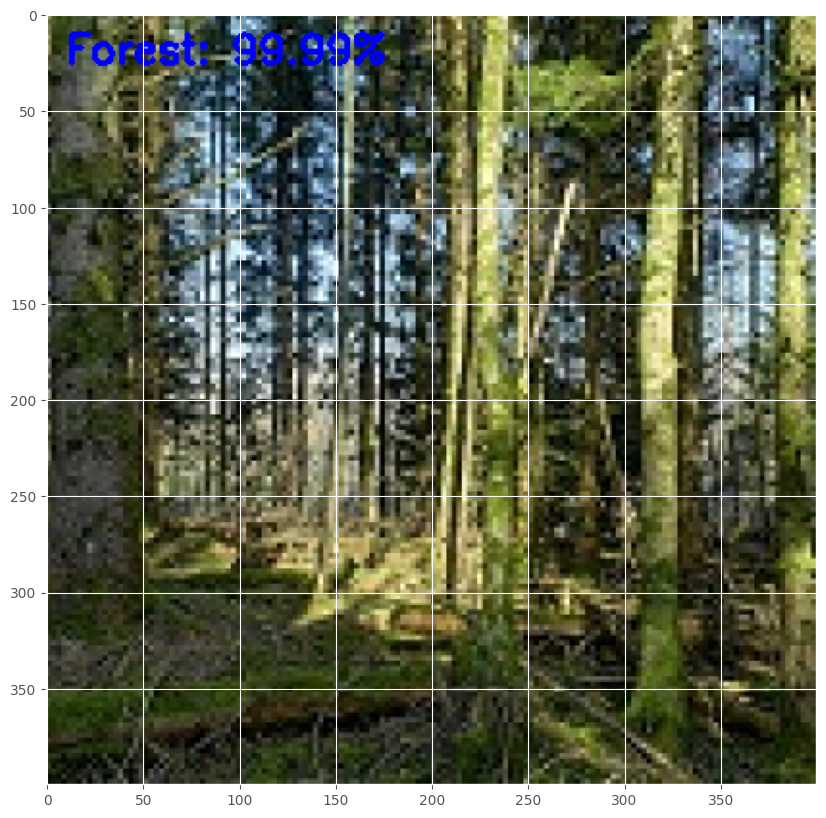

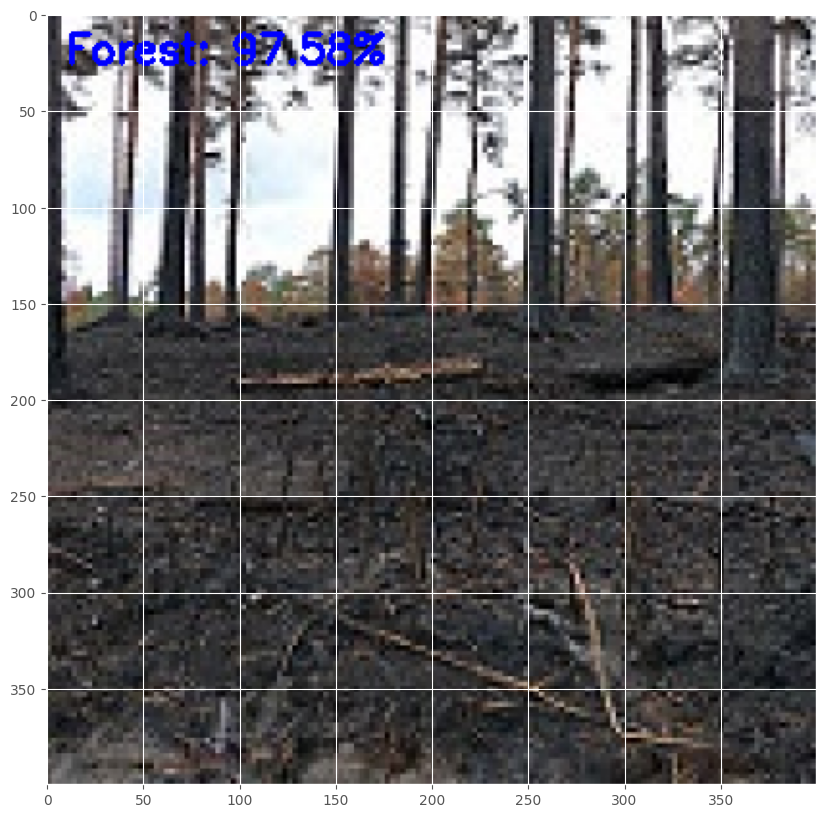

In [ ]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2

# # load the model
print("[INFO] loading network and...")
# model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('test_examples')))   # data folder with 2 categorical folders

all_class = ["Buildings", "Forest", "Sea"]


# progress bar
with tqdm(total=len(testImagePaths)) as pbar:

    for imagePath in testImagePaths:

        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf= model.predict(image)[0] # [[0.1 , 0.8 , 0.1]]
        print(prd_conf)

        # build the label
        label = all_class[np.argmax(prd_conf)] #[b f s]-> f
        proba = prd_conf[np.argmax(prd_conf)] # [0.1 , 0.8 , 0.1]  -> 0.8

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 0, 0), 2)

        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

        pbar.update(1)


In [ ]:
!pip install gradio

In [ ]:
import gradio as gr

In [ ]:
def predict_image(image):
    # load the image

    # pre-process the image for classification
    image = cv2.resize(image, (28, 28))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)


    preds = model.predict(image)[0]
    result = dict()
    result["Buildings"] = round(float(list(preds)[0]), 3)
    result["Forest"] = round(float(list(preds)[1]), 3)
    result["Sea"] = round(float(list(preds)[2]), 3)

    print(result)

    return result

In [ ]:
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://1c1887589530b136a6.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
